In [1]:
# Basics imports
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
kb = pd.read_csv('./heart.csv')
kb.head(5)

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1


**Atributes:**  
age: Age  
sex: Sex (1 = male; 0 = female)  
cp: Chest pain (typical, asymptotic, nonanginal, nontypical)  
trestbps: Resting blood pressure  
chol: Serum cholestoral in mg/dl  
fbs: Fasting blood sugar > 120 mg/dl (1 = true; 0 = false)  
restecg: Resting electrocardiographic results  
thalach: Maximum heart rate achieved  
exang: Exercise induced angina (1 = yes; 0 = no)  
oldpeak: ST depression induced by exercise relative to rest  
slope: Slope of the peak exercise ST segment  
ca: Number of major vessels colored by flourosopy (0 - 3)  
thal: (3 = normal; 6 = fixed defect; 7 = reversable defect)  
target: AHD - Diagnosis of heart disease (1 = yes; 0 = no)  

In [2]:
kb.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       303 non-null    int64  
 1   sex       303 non-null    int64  
 2   cp        303 non-null    int64  
 3   trestbps  303 non-null    int64  
 4   chol      303 non-null    int64  
 5   fbs       303 non-null    int64  
 6   restecg   303 non-null    int64  
 7   thalach   303 non-null    int64  
 8   exang     303 non-null    int64  
 9   oldpeak   303 non-null    float64
 10  slope     303 non-null    int64  
 11  ca        303 non-null    int64  
 12  thal      303 non-null    int64  
 13  target    303 non-null    int64  
dtypes: float64(1), int64(13)
memory usage: 33.3 KB


# Visualize the Data

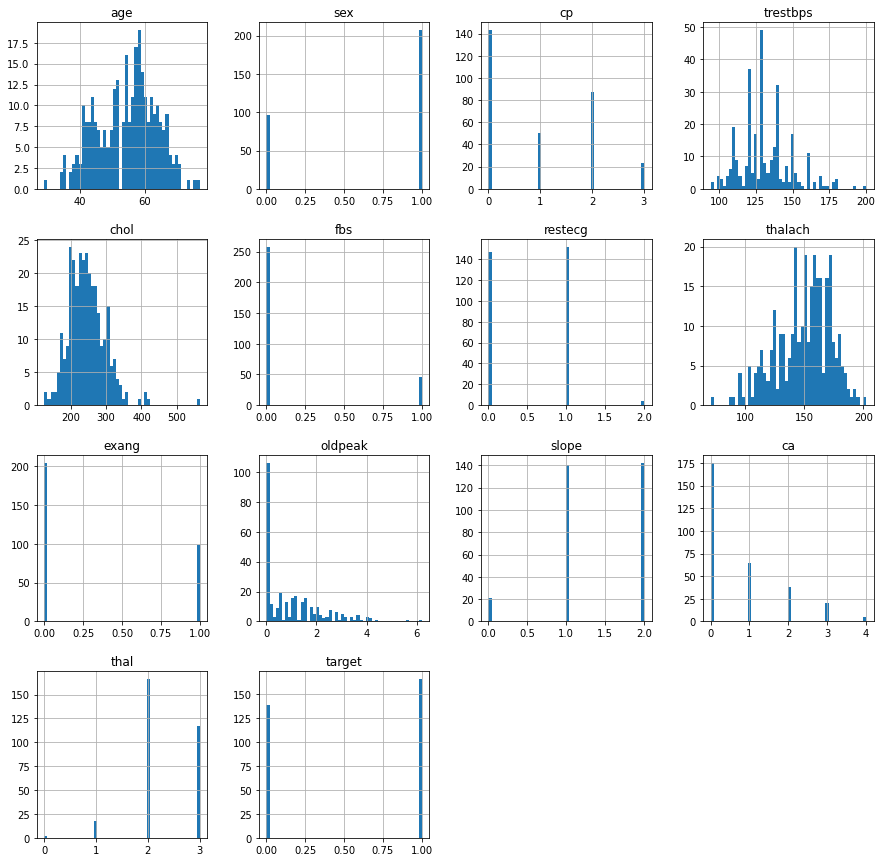

In [3]:
kb.hist(bins=50, figsize=(15,15))
plt.show()

# Pre-process the data

In [4]:
# Check for missing values
kb.isnull().values.any()

False

In [5]:
# Split the data: 80% for training, 20% for testing
from sklearn.model_selection import StratifiedShuffleSplit
split = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
for train_index, test_index in split.split(kb, kb['target']):
    strat_train_set = kb.loc[train_index]
    strat_test_set = kb.loc[test_index]

In [6]:
# Visualize the training data set
strat_train_set.describe()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
count,242.000000,242.000000,242.000000,242.000000,242.000000,242.000000,242.000000,242.000000,242.000000,242.000000,242.000000,242.000000,242.000000,242.000000
mean,54.289256,0.681818,0.942149,131.706612,244.884298,0.140496,0.545455,150.123967,0.338843,1.071901,1.413223,0.743802,2.338843,0.545455
std,9.153317,0.466736,1.008656,17.994486,47.847387,0.348221,0.531185,21.977948,0.474297,1.206258,0.620125,1.042889,0.605010,0.498962
min,29.000000,0.000000,0.000000,94.000000,126.000000,0.000000,0.000000,88.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,47.000000,0.000000,0.000000,120.000000,211.250000,0.000000,0.000000,137.250000,0.000000,0.000000,1.000000,0.000000,2.000000,0.000000
50%,55.500000,1.000000,1.000000,130.000000,240.000000,0.000000,1.000000,152.000000,0.000000,0.800000,1.000000,0.000000,2.000000,1.000000
75%,61.000000,1.000000,2.000000,140.000000,273.750000,0.000000,1.000000,166.000000,1.000000,1.800000,2.000000,1.000000,3.000000,1.000000
max,77.000000,1.000000,3.000000,200.000000,409.000000,1.000000,2.000000,202.000000,1.000000,6.200000,2.000000,4.000000,3.000000,1.000000


# Correlation

array([[<AxesSubplot:xlabel='age', ylabel='age'>,
        <AxesSubplot:xlabel='sex', ylabel='age'>,
        <AxesSubplot:xlabel='cp', ylabel='age'>,
        <AxesSubplot:xlabel='trestbps', ylabel='age'>,
        <AxesSubplot:xlabel='chol', ylabel='age'>,
        <AxesSubplot:xlabel='fbs', ylabel='age'>,
        <AxesSubplot:xlabel='restecg', ylabel='age'>,
        <AxesSubplot:xlabel='thalach', ylabel='age'>,
        <AxesSubplot:xlabel='exang', ylabel='age'>,
        <AxesSubplot:xlabel='oldpeak', ylabel='age'>,
        <AxesSubplot:xlabel='ca', ylabel='age'>,
        <AxesSubplot:xlabel='thal', ylabel='age'>,
        <AxesSubplot:xlabel='target', ylabel='age'>,
        <AxesSubplot:xlabel='slope', ylabel='age'>],
       [<AxesSubplot:xlabel='age', ylabel='sex'>,
        <AxesSubplot:xlabel='sex', ylabel='sex'>,
        <AxesSubplot:xlabel='cp', ylabel='sex'>,
        <AxesSubplot:xlabel='trestbps', ylabel='sex'>,
        <AxesSubplot:xlabel='chol', ylabel='sex'>,
        <AxesSubplot

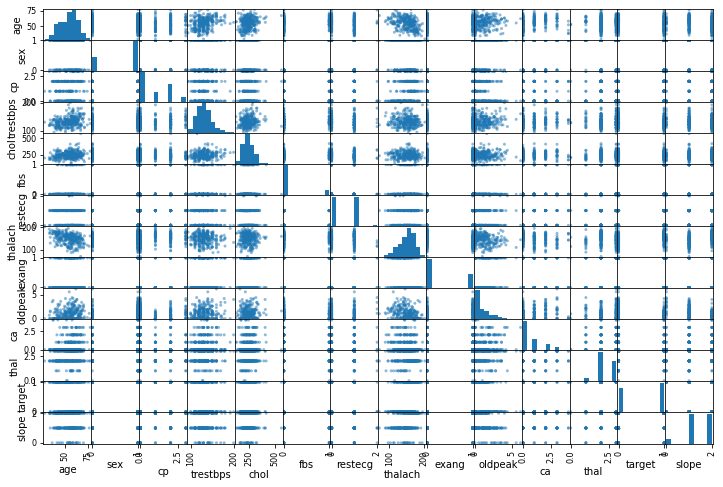

In [7]:
# Using scatter_matrix to find out if there is correlation between the attributes
from pandas.plotting import scatter_matrix
attributes = ['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach', 'exang', 'oldpeak', 'ca', 'thal', 'target', 'slope'] 
scatter_matrix(kb[attributes], figsize=(12,8))

In [8]:
# Finding which attribute is most related to target attribute
corr_matrix = kb.corr()
corr_matrix['target'].sort_values(ascending=False)

target      1.000000
cp          0.433798
thalach     0.421741
slope       0.345877
restecg     0.137230
fbs        -0.028046
chol       -0.085239
trestbps   -0.144931
age        -0.225439
sex        -0.280937
thal       -0.344029
ca         -0.391724
oldpeak    -0.430696
exang      -0.436757
Name: target, dtype: float64

In [9]:
# this is the chunk we'll feed to our model to learn
kb = strat_train_set.drop("target", axis=1)
# this is our target in our training dataset which our model should learn
kb_labels = strat_train_set['target'].copy()

# Pipelines

In [10]:
from sklearn.base import BaseEstimator, TransformerMixin

# this component allows us to select entire or partial dataframe
# or in simpler words we can tell which attributes we want in our pipeline
class DataFrameSelector(BaseEstimator, TransformerMixin):
    
    def __init__(self, attribute_names):
        self.attribute_names = attribute_names
        
    def fit(self, X, y=None):return self
    
    def transform(self, X):return X[self.attribute_names].values

In [11]:
class MyLabelBinarizer(TransformerMixin):
    
    def __init__(self, *args, **kwargs):
        self.encoder = OneHotEncoder(*args, **kwargs)
    
    def fit(self, x, y=0):
        self.encoder.fit(x)
        return self
    
    def transform(self, x, y=0):return self.encoder.transform(x)

In [12]:
num_attribs = ['age', 'trestbps', 'chol', 'thalach', 'oldpeak'] 
cat_attribs = ['sex', 'cp', 'fbs', 'restecg', 'exang', 'slope', 'ca', 'thal']

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import FeatureUnion
from sklearn.preprocessing import OneHotEncoder
from sklearn.impute import SimpleImputer

# our numerical pipeline
num_pipeline = Pipeline([
                    ('selector', DataFrameSelector(num_attribs)),
                    ('imputer', SimpleImputer(strategy="median")),
                    ('std_scaler', StandardScaler()),
                ])

# our categorical pipeline
cat_pipeline = Pipeline([
    ('selector', DataFrameSelector(cat_attribs)),
    ('label_binarizer', MyLabelBinarizer(sparse=False)),
])

# our full pipeline
full_pipeline = FeatureUnion(transformer_list=[
    ('num_pipeline', num_pipeline),
    ('cat_pipeline', cat_pipeline),
])

In [13]:
kb_prepared = full_pipeline.fit_transform(kb)
kb_prepared

array([[ 1.61047991,  0.46184018, -0.12323542, ...,  0.        ,
         1.        ,  0.        ],
       [ 1.28205058,  1.57559529,  0.02336627, ...,  1.        ,
         0.        ,  0.        ],
       [ 0.0778097 , -0.20641288, -0.83530077, ...,  0.        ,
         0.        ,  1.        ],
       ...,
       [-0.36009607, -0.65191492,  1.04957809, ...,  0.        ,
         1.        ,  0.        ],
       [ 0.0778097 , -0.09503737,  0.35845584, ...,  0.        ,
         1.        ,  0.        ],
       [ 1.0630977 ,  2.68935039,  1.67787105, ...,  0.        ,
         1.        ,  0.        ]])

# Testing ML models

## Decision Tree Classifier with K-fold cross validation

In [14]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, make_scorer

scorer= make_scorer(accuracy_score)

tree_clas = DecisionTreeClassifier()
scores = cross_val_score(tree_clas, kb_prepared, kb_labels,
                        scoring=scorer, cv=10)
# see the 10 scores
scores

array([0.72      , 0.68      , 0.70833333, 0.75      , 0.70833333,
       0.79166667, 0.79166667, 0.79166667, 0.83333333, 0.79166667])

In [15]:
print("Mean:\t\t ", scores.mean(), "\nStandard Deviation:", scores.std())

Mean:		  0.7566666666666666 
Standard Deviation: 0.04766200443400031


## Random Forest Classifier

In [16]:
from sklearn.ensemble import RandomForestClassifier
forest_clas = RandomForestClassifier(n_estimators=100)
forest_clas.fit(kb_prepared, kb_labels)
forest_scores = cross_val_score(forest_clas, kb_prepared, kb_labels,
                               scoring=scorer, cv=10)

print("Mean:\t\t ", forest_scores.mean(), "\nStandard Deviation:", forest_scores.std())

Mean:		  0.8353333333333332 
Standard Deviation: 0.07907380518646277


## Logistic Regression

In [17]:
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression(solver='liblinear', random_state=99)
lr_scores = cross_val_score(lr, kb_prepared, kb_labels,
                        scoring=scorer, cv=10)

print("Mean:\t\t ", lr_scores.mean(), "\nStandard Deviation:", lr_scores.std())

Mean:		  0.8474999999999999 
Standard Deviation: 0.05738394084294548


## Gradient Boosting Classifier

In [18]:
from sklearn.ensemble import GradientBoostingClassifier

gr_boost = GradientBoostingClassifier(n_estimators=100, random_state=99)
gr_scores = cross_val_score(gr_boost, kb_prepared, kb_labels,
                        scoring=scorer, cv=5)

print("Mean:\t\t ", gr_scores.mean(), "\nStandard Deviation:", gr_scores.std())

Mean:		  0.8226190476190476 
Standard Deviation: 0.05197616699319731


## KNeighborsClassifier

In [19]:
from sklearn.neighbors import KNeighborsClassifier

knei = KNeighborsClassifier(n_neighbors=5, weights='distance')
knei_scores = cross_val_score(knei, kb_prepared, kb_labels,
                        scoring=scorer, cv=5)

print("Mean:\t\t ", knei_scores.mean(), "\nStandard Deviation:", knei_scores.std())

Mean:		  0.8142006802721088 
Standard Deviation: 0.03077479518828718


# Fine tune our models with Hyper parameters

## Random Forest Classifier

In [20]:
from sklearn.model_selection import GridSearchCV
param_grid = [
    {
        'criterion': ['entropy', 'gini'],
        'min_samples_leaf': [10, 15, 20],
        'max_depth': [10, 15, 20],
        'n_estimators' : range(40, 120, 20)
    }
  ]

forest_reg = RandomForestClassifier()
grid_search = GridSearchCV(forest_reg, param_grid, cv=5,
                          scoring=scorer)
grid_search.fit(kb_prepared, kb_labels)
grid_search.best_estimator_

RandomForestClassifier(max_depth=15, min_samples_leaf=20, n_estimators=80)

In [21]:
cvres = grid_search.cv_results_
print("{}\t\t {}\n".format('Mean Score','Parameters'))
for mean_score, params in zip(cvres["mean_test_score"], cvres["params"]):
    x = mean_score
    y = params
    print("{:.2f}\t {}".format(x, y))

Mean Score		 Parameters

0.84	 {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 10, 'n_estimators': 40}
0.83	 {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 10, 'n_estimators': 60}
0.84	 {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 10, 'n_estimators': 80}
0.84	 {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 10, 'n_estimators': 100}
0.82	 {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 15, 'n_estimators': 40}
0.85	 {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 15, 'n_estimators': 60}
0.84	 {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 15, 'n_estimators': 80}
0.84	 {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 15, 'n_estimators': 100}
0.84	 {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 20, 'n_estimators': 40}
0.82	 {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 20, 'n_estimators': 60}
0.83	 {'criterion': 'entropy', 'max_depth': 10, 'min_

## KNeighborsClassifier

In [34]:
from sklearn.neighbors import KNeighborsClassifier

param_grid_knei = {
        'n_neighbors': list(range(5, 35, 10)),
        'leaf_size': list(range(5, 35, 10)),
        'p': [1, 2, 3],
    }

knei = KNeighborsClassifier()
grid_search_knei = GridSearchCV(knei, param_grid_knei, cv=5,
                          scoring=scorer)
grid_search_knei.fit(kb_prepared, kb_labels)
grid_search_knei.best_estimator_

KNeighborsClassifier(leaf_size=5, p=1)

In [35]:
cvres = grid_search_knei.cv_results_
print("{}\t\t {}\n".format('Mean Score','Parameters'))
for mean_score, params in zip(cvres["mean_test_score"], cvres["params"]):
    x = mean_score
    y = params
    print("{:.2f}\t {}".format(x, y))

Mean Score		 Parameters

0.86	 {'leaf_size': 5, 'n_neighbors': 5, 'p': 1}
0.81	 {'leaf_size': 5, 'n_neighbors': 5, 'p': 2}
0.81	 {'leaf_size': 5, 'n_neighbors': 5, 'p': 3}
0.82	 {'leaf_size': 5, 'n_neighbors': 15, 'p': 1}
0.80	 {'leaf_size': 5, 'n_neighbors': 15, 'p': 2}
0.80	 {'leaf_size': 5, 'n_neighbors': 15, 'p': 3}
0.85	 {'leaf_size': 5, 'n_neighbors': 25, 'p': 1}
0.82	 {'leaf_size': 5, 'n_neighbors': 25, 'p': 2}
0.79	 {'leaf_size': 5, 'n_neighbors': 25, 'p': 3}
0.86	 {'leaf_size': 15, 'n_neighbors': 5, 'p': 1}
0.81	 {'leaf_size': 15, 'n_neighbors': 5, 'p': 2}
0.81	 {'leaf_size': 15, 'n_neighbors': 5, 'p': 3}
0.82	 {'leaf_size': 15, 'n_neighbors': 15, 'p': 1}
0.80	 {'leaf_size': 15, 'n_neighbors': 15, 'p': 2}
0.80	 {'leaf_size': 15, 'n_neighbors': 15, 'p': 3}
0.85	 {'leaf_size': 15, 'n_neighbors': 25, 'p': 1}
0.82	 {'leaf_size': 15, 'n_neighbors': 25, 'p': 2}
0.79	 {'leaf_size': 15, 'n_neighbors': 25, 'p': 3}
0.86	 {'leaf_size': 25, 'n_neighbors': 5, 'p': 1}
0.81	 {'leaf_size': 25

## Gradient Boosting Classifier

In [24]:
param_grid_gbc = {
        'learning_rate' : list(np.linspace(0.01, 0.5, 5)),
        'n_estimators': list(range(10, 80, 10))
    }

gbc = GradientBoostingClassifier()
grid_search_gbc = GridSearchCV(gbc, param_grid_gbc, cv=5,
                          scoring=scorer)
grid_search_gbc.fit(kb_prepared, kb_labels)
grid_search_gbc.best_estimator_

GradientBoostingClassifier(learning_rate=0.255, n_estimators=10)

In [25]:
cvres = grid_search_gbc.cv_results_
print("{}\t\t {}\n".format('Mean Score','Parameters'))
for mean_score, params in zip(cvres["mean_test_score"], cvres["params"]):
    x = mean_score
    y = params
    print("{:.2f}\t {}".format(x, y))

Mean Score		 Parameters

0.72	 {'learning_rate': 0.01, 'n_estimators': 10}
0.77	 {'learning_rate': 0.01, 'n_estimators': 20}
0.79	 {'learning_rate': 0.01, 'n_estimators': 30}
0.80	 {'learning_rate': 0.01, 'n_estimators': 40}
0.80	 {'learning_rate': 0.01, 'n_estimators': 50}
0.79	 {'learning_rate': 0.01, 'n_estimators': 60}
0.79	 {'learning_rate': 0.01, 'n_estimators': 70}
0.82	 {'learning_rate': 0.1325, 'n_estimators': 10}
0.83	 {'learning_rate': 0.1325, 'n_estimators': 20}
0.82	 {'learning_rate': 0.1325, 'n_estimators': 30}
0.83	 {'learning_rate': 0.1325, 'n_estimators': 40}
0.83	 {'learning_rate': 0.1325, 'n_estimators': 50}
0.83	 {'learning_rate': 0.1325, 'n_estimators': 60}
0.83	 {'learning_rate': 0.1325, 'n_estimators': 70}
0.84	 {'learning_rate': 0.255, 'n_estimators': 10}
0.81	 {'learning_rate': 0.255, 'n_estimators': 20}
0.80	 {'learning_rate': 0.255, 'n_estimators': 30}
0.80	 {'learning_rate': 0.255, 'n_estimators': 40}
0.80	 {'learning_rate': 0.255, 'n_estimators': 50}
0.81	 

## Logistic Regression

In [26]:
param_grid_lr = [
        {
            'solver': ['liblinear'], 'penalty': ['l1', 'l2'], 'max_iter': list(range(10, 80, 10))
        },{
            'solver': ['newton-cg', 'lbfgs', 'sag'], 'penalty': ['none', 'l2'], 'max_iter': list(range(10, 100, 20))
        }, {
            'solver': ['saga'], 'penalty': ['none', 'l1', 'l2'], 'max_iter': list(range(10, 100, 20))
        }
    ]

lr = LogisticRegression()
grid_search_lr = GridSearchCV(lr, param_grid_lr, cv=5,
                          scoring=scorer)
grid_search_lr.fit(kb_prepared, kb_labels)
grid_search_lr.best_estimator_

LogisticRegression(max_iter=30, penalty='l1', solver='liblinear')

In [27]:
cvres = grid_search_lr.cv_results_
print("{}\t\t {}\n".format('Mean Score','Parameters'))
for mean_score, params in zip(cvres["mean_test_score"], cvres["params"]):
    x = mean_score
    y = params
    print("{:.2f}\t {}".format(x, y))

Mean Score		 Parameters

0.86	 {'max_iter': 10, 'penalty': 'l1', 'solver': 'liblinear'}
0.85	 {'max_iter': 10, 'penalty': 'l2', 'solver': 'liblinear'}
0.86	 {'max_iter': 20, 'penalty': 'l1', 'solver': 'liblinear'}
0.85	 {'max_iter': 20, 'penalty': 'l2', 'solver': 'liblinear'}
0.86	 {'max_iter': 30, 'penalty': 'l1', 'solver': 'liblinear'}
0.85	 {'max_iter': 30, 'penalty': 'l2', 'solver': 'liblinear'}
0.86	 {'max_iter': 40, 'penalty': 'l1', 'solver': 'liblinear'}
0.85	 {'max_iter': 40, 'penalty': 'l2', 'solver': 'liblinear'}
0.86	 {'max_iter': 50, 'penalty': 'l1', 'solver': 'liblinear'}
0.85	 {'max_iter': 50, 'penalty': 'l2', 'solver': 'liblinear'}
0.86	 {'max_iter': 60, 'penalty': 'l1', 'solver': 'liblinear'}
0.85	 {'max_iter': 60, 'penalty': 'l2', 'solver': 'liblinear'}
0.86	 {'max_iter': 70, 'penalty': 'l1', 'solver': 'liblinear'}
0.85	 {'max_iter': 70, 'penalty': 'l2', 'solver': 'liblinear'}
0.84	 {'max_iter': 10, 'penalty': 'none', 'solver': 'newton-cg'}
0.84	 {'max_iter': 10, 'pena

# Evaluating your model on the test set

In [37]:
# The best model we found was the Logistic Regression
final_model = grid_search_lr.best_estimator_
X_test = strat_test_set.drop("target", axis=1)
y_test = strat_test_set["target"].copy()
# we prepare the data
X_test_prepared = full_pipeline.transform(X_test)
# do the prediction
final_predictions = final_model.predict(X_test_prepared)
# find score
final_score = accuracy_score(y_test, final_predictions)
final_score

0.8524590163934426